# NYC Airbnb Price Analysis

## Kiran Benny
### 01/05/2020

## Introduction

Airbnb, Inc. is an online marketplace for arranging or offering lodging, primarily homestays, or tourism experiences. The company does not own any of the real estate listings, nor does it host events; it acts as a broker, receiving commissions from each booking. 

The purpose of this notebook is to perform an exploratory data analysis on the various Airbnb listings data in New York City for the year 2019. 

The data, sourced from Kaggle, contains all the Airbnb listings in New York for the year 2019.

Loading the required libraries, frameworks and data:

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.pyplot as plt 

import folium
import folium.plugins
from folium.plugins import MarkerCluster
from folium import plugins

import wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from wordcloud import WordCloud, ImageColorGenerator

import plotly.express as px

In [2]:
df = pd.read_csv(r'C:\Users\benny\OneDrive\Desktop\Misc\RandC\Projects\NYC Airbnb Price Analysis\AB_NYC_2019.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


## Data Cleaning

Checking if there are any null values in the data:

In [3]:
df.isnull().sum() #finding null values

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

We notice that there are quite a few null values in some of the variables. These null values might interefere with our analysis and hence, it is necessary to either remove the null values completely or replace them with a suitable value. Let's replace the null values in the variable 'Reviews per month' with zero and the null values in 'name', 'host name' and 'last review' variables with 'Not Specified'. 

In [4]:
df.fillna({'reviews_per_month':0}, inplace=True) #replace null values in reviews_per_month by zero
df["name"].fillna("Not Specified", inplace = True)
df["host_name"].fillna("Not Specified", inplace = True)
df["last_review"].fillna("Not Specified", inplace = True)

In [5]:
df.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

## Statistical Summary

In [6]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.090910,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.597283,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


## Correlation

Let's take a look at how the variables correlate to the price variable.

[Text(0.5, 0, 'price'),
 Text(1.5, 0, 'latitude'),
 Text(2.5, 0, 'longitude'),
 Text(3.5, 0, 'minimum_nights'),
 Text(4.5, 0, 'number_of_reviews'),
 Text(5.5, 0, 'reviews_per_month'),
 Text(6.5, 0, 'calculated_host_listings_count'),
 Text(7.5, 0, 'availability_365')]

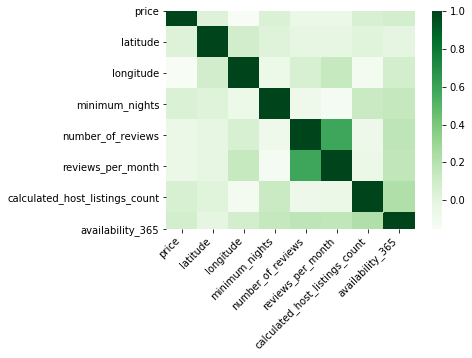

In [7]:
CM = df[['price','neighbourhood_group','neighbourhood', 'latitude', 'longitude', 'room_type','minimum_nights','number_of_reviews',
         'reviews_per_month','calculated_host_listings_count', 'availability_365']]
cor = CM.corr() #Calculate the correlation of the above variables
cm=sns.heatmap(cor, cmap = 'Greens', square = True) #Plot the correlation as heat map
cm.set_xticklabels(cm.get_xticklabels(),
        rotation=45,
    horizontalalignment='right')
#not very strong correlations except for number of reviews and reviews per month

The variables don't seem to correlate very strongly with the price variable apart from the 'number of reviews' and 'reviews per month' variables, depicted using the darker shade of green.

# Exploratory Data Analysis

In this section of the notebook, we will explore the data through various visualizations. 

## By Borough

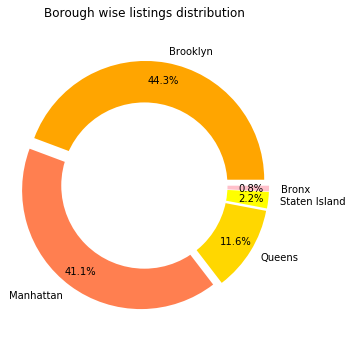

In [8]:
fig1, ax1 = plt.subplots(figsize=(5,5))
# Create a pie chart
ax1.pie(
   df['neighbourhood_group'].value_counts(),
    labels = df.neighbourhood_group.unique(),
    pctdistance=0.85,
    explode = (0.05,0.05,0.05,0.05,0.05),
    colors = ['orange', 'coral', 'gold', 'yellow', 'pink', ],
    # with the percent listed as a fraction
    autopct='%1.1f%%',
    )

#for donut chart
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig2 = plt.gcf()
fig2.gca().add_artist(centre_circle)

ax1.set_title('Airbnb distribution in different Boroughs')

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.title('Borough wise listings distribution')
plt.show()

#manhattan and brooklyn have most airbnbs

From the donut chart, Brooklyn and Manhattan share the most number of Airbnb listings followed by Queens, with Staten Island and Bronx having the least percentage of Airbnb listings.

Let's visualize the number of listings on the New York City Map.

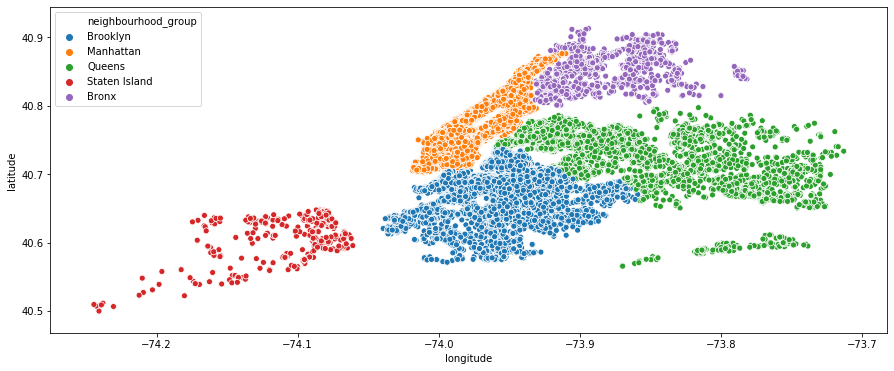

In [9]:
plt.figure(figsize=(15,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group)


## By Price

The 3D visualizations below show the price distribution of the listings by borough and room type. Staten Island seems to contain the least expensive listings as compared to all the other boroughs. 

In [10]:
fig = px.scatter_3d(df, x='latitude', y='longitude', z='price',
              color='neighbourhood_group')
fig.show()

In [11]:
fig = px.scatter_3d(df, x='room_type', y='neighbourhood_group', z='price',
              color='room_type')
fig.show()

Top 5 neighbourhoods with the least expensive listings:

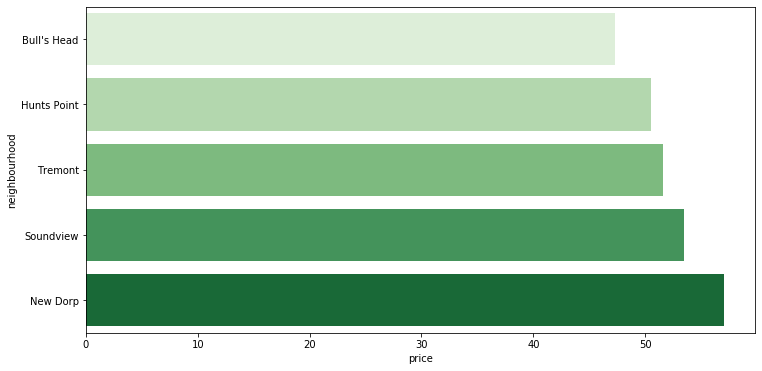

In [12]:
Inexpensive_neighbourhoods = df.groupby('neighbourhood').agg({'price': 'mean'}).sort_values('price').reset_index()
plt.figure(figsize=(12,6))
sns.barplot(y="neighbourhood", x="price", palette = 'Greens', data=Inexpensive_neighbourhoods.head(5))
plt.ioff()

Top 5 neighbourhoods with the most expensive listings:

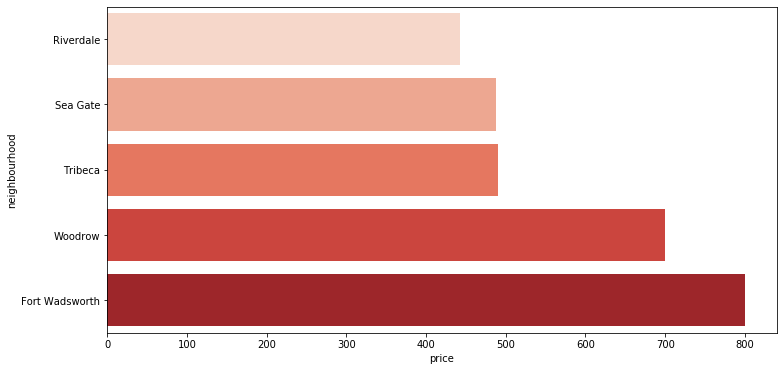

In [13]:
plt.figure(figsize=(12,6))
sns.barplot(y="neighbourhood", x="price", palette = 'Reds', data=Inexpensive_neighbourhoods.tail(5))
plt.ioff()

Plotting all the listings in New York City on a heat map based on their price distribution:

<Figure size 720x432 with 0 Axes>

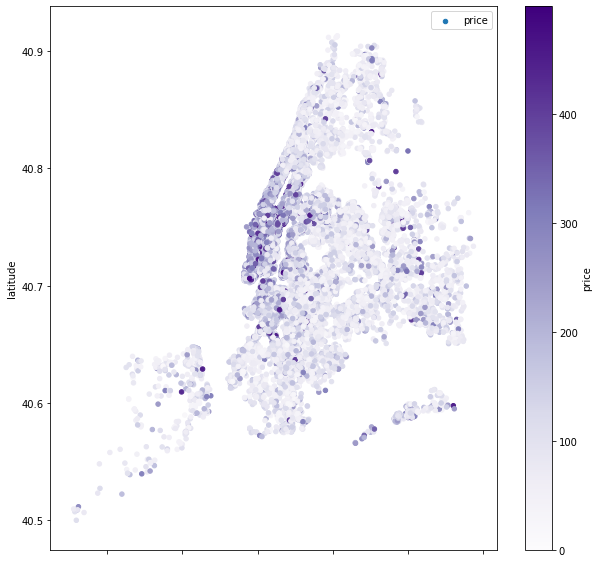

In [14]:
plt.figure(figsize=(10,6))
sub=df[df.price<500]
scat=sub.plot(kind='scatter', x='longitude',y='latitude', label = 'price', cmap = 'Purples', c='price',colorbar=True,figsize=(10,10));
scat.legend()

## By Room Type

Brooklyn contains the most number of private room listings. Manhattan tops the list of Entire home/apartment listings. Shared rooms aren't very popular amongst any of the boroughs. 

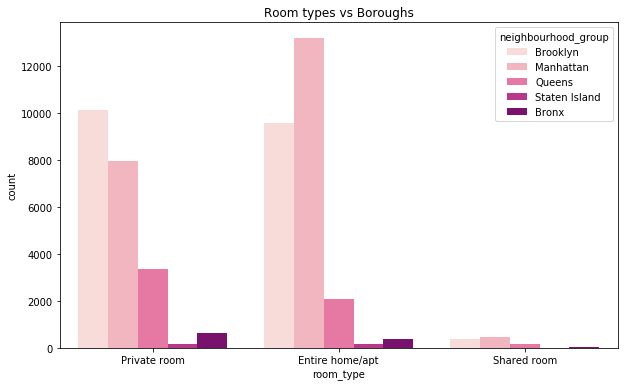

In [15]:
plt.figure(figsize=(10,6))
sns.countplot(x = 'room_type',hue = 'neighbourhood_group', palette = 'RdPu', data = df)
plt.title('Room types vs Boroughs')
plt.show()

## By Popularity

Most popular rooms based off the number of reviews:

In [16]:
most_popular=df.sort_values(by=['number_of_reviews'],ascending=False).head(100)
most_popular.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Dona,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,2019-07-05,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,2019-06-21,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,2019-06-23,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,2019-06-15,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,2019-06-27,13.40,2,173


In [17]:
print('Most Popular Rooms')
map=folium.Map(location = [40.73,-73.93])

map_rooms=plugins.MarkerCluster().add_to(map)

for lat,lon,label in zip(most_popular.latitude,most_popular.longitude,most_popular.name):
    folium.Marker(location=[lat,lon],icon=folium.Icon(icon='fire'),popup=label).add_to(map_rooms)
map.add_child(map_rooms)

map

Most Popular Rooms


Lastly, let's create a wordcloud to visualize the most commonly used words in listings:

<Figure size 720x432 with 0 Axes>

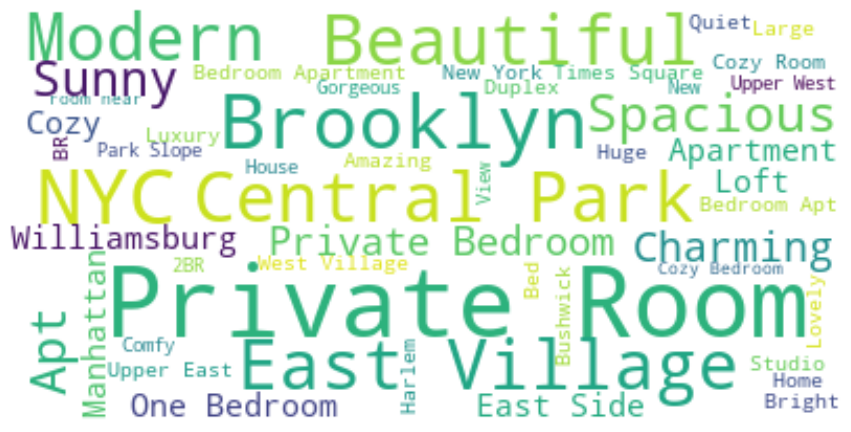

In [18]:
#word cloud
text = " ".join(str(each) for each in df.name)
# Create and generate a word cloud image:
wordcloud = WordCloud(max_words=50, background_color="white").generate(text)
plt.figure(figsize=(10,6))
plt.figure(figsize=(15,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Conclusion

Through the explorartory data analysis conducted on the Airbnb Listings in New York City for the year 2019, we have successfully extracted a number of insights from the data, and through the different visualizations, identified the many  trends and patterns present in the data.